# Capstone Project Notebook for IBM Data Science Coursera #
## The Battle of Neighborhoods ##

In [1]:
# import libraries
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib import pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

import math

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2019.11.28         |   py36h9f0ad1d_1         149 KB  conda-forge
    geopy-1.21.0               |             py_0          58 KB  conda-forge
    ca-certificates-2019.11.28 |       hecc5488_0         145 KB  conda-forge
    openssl-1.1.1e             |       h516909a_0         2.1 MB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.5 MB

The following NEW packages will be INSTALLED:

    geographiclib:   1.50-py_0         conda-forge
    geopy:           1

In [3]:
# communes de l'agglomeration de Lyon
!wget -q -O 'adr_voie_lieu.adrcommune.json' https://www.data.gouv.fr/fr/datasets/r/dac5c361-566f-4e70-9dbd-187bae7bebbe
# quartiers/neighborhoods de l'agglomeration de Lyon
!wget -q -O 'adr_voie_lieu.adrquartier.json' https://www.data.gouv.fr/fr/datasets/r/d4095ad7-4aa1-4ef4-9b2a-d804201cea97
    
print('Data downloaded!')

Data downloaded!


In [4]:
with open('adr_voie_lieu.adrcommune.json') as json_data:
    commune_metropole_lyon_data = json.load(json_data)
with open('adr_voie_lieu.adrquartier.json') as json_data:
    quartier_metropole_lyon_data = json.load(json_data)

In [5]:
# create a map of the metropole of Lyon
latitude = 45.7640
longitude = 4.8357

In [6]:
lyon_map = folium.Map(location=[latitude, longitude], zoom_start=11)
# generate choropleth map using the neighporhoods
lyon_map.choropleth(
    geo_data=quartier_metropole_lyon_data,
    #data=df_,
    #columns=['', 'Total'],
    #key_on='feature.properties.name',
    #fill_color='YlOrRd', 
    #fill_opacity=0.7, 
    #line_opacity=0.2,
    #legend_name=' '
)

# display map
lyon_map

#### The neighborhoods seem to be not complete as we can see so let's have a look on the cities of the Metropole de Lyon

In [7]:
lyon_map = folium.Map(location=[latitude, longitude], zoom_start=10)
# generate choropleth map using the cities
lyon_map.choropleth(
    geo_data=commune_metropole_lyon_data,
    #data=df_,
    #columns=['', 'Total'],
    #key_on='feature.properties.name',
    #fill_color='YlOrRd', 
    #fill_opacity=0.7, 
    #line_opacity=0.2,
    #legend_name=' '
)

# display map
lyon_map

#### The cities of the Metropole de Lyon is too large so we keep the neighborhoods

In [8]:
neighborhoods_data = quartier_metropole_lyon_data['features']
#neighborhoods_data2 = commune_metropole_lyon_data['features']
neighborhoods_data[0]

{'type': 'Feature',
 'properties': {'gml_id': 'adr_voie_lieu.adrquartier.3220',
  'nom': 'Quartier Clochettes',
  'theme': 'HABITAT',
  'soustheme': 'Quartier',
  'identifiant': 'S5362',
  'timePosition': '2010-10-29',
  'gid': 3220,
  'style': {'weight': 1,
   'opacity': 1,
   'color': 'black',
   'fillOpacity': 0.6,
   'fillColor': 'blue'},
  'highlight': {}},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[4.852207, 45.69420699905707],
    [4.852191, 45.69322099905709],
    [4.852146, 45.69263299905708],
    [4.852091, 45.69158099905708],
    [4.852077, 45.69110699905707],
    [4.852067, 45.690457999057074],
    [4.852076, 45.69018299905707],
    [4.852092, 45.69001599905707],
    [4.852111, 45.689669999057074],
    [4.852197, 45.68925299905708],
    [4.852381, 45.68847399905709],
    [4.852745, 45.68759599905709],
    [4.852989, 45.68761799905708],
    [4.85299, 45.687617999057075],
    [4.852994, 45.68761799905708],
    [4.85302, 45.687620999057074],
    [4.853023, 45.6876209

#### As we see, the coordinates indicate the limit of the neighborhood and not it's centroid
#### so we will calculate the centroid to get the lat and long of the neighborhoods while creating our dataframe

In [9]:
# define the dataframe columns
column_names = ['Quartier','Lat','Long'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [10]:
for data in neighborhoods_data:
    neighborhood_name = data['properties']['nom']
       
    neighborhood_latlon = data['geometry']['coordinates'][0]
    neighborhood_lat = 0
    neighborhood_long = 0
    for coordonnee in neighborhood_latlon:
        neighborhood_lat = neighborhood_lat + coordonnee[1]
        neighborhood_long = neighborhood_long + coordonnee[0]
    neighborhood_lat = neighborhood_lat/ len(neighborhood_latlon)
    neighborhood_long = neighborhood_long / len(neighborhood_latlon)
    neighborhoods = neighborhoods.append({'Quartier': neighborhood_name,
                                          'Lat': neighborhood_lat,
                                          'Long': neighborhood_long}, ignore_index=True)


In [11]:
neighborhoods.head()

,Quartier,Lat,Long
0,Quartier Clochettes,45.692397,4.855934
1,Quartier Pasteur,45.691369,4.898562
2,Quartier Ménival La Cordière,45.695174,4.950974
3,Quartier Ménival Battières La Plaine,45.752027,4.783056
4,Quartier Jules Guesde,45.710772,4.886712


In [12]:
# create map of Lyon using latitude and longitude values
map_lyon = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, quartier in zip(neighborhoods['Lat'], neighborhoods['Long'], neighborhoods['Quartier']):
    label = '{}'.format(quartier)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#4B0082',
        fill_opacity=0.7,
        parse_html=False).add_to(map_lyon)  
    
map_lyon

#### Foursquare don't give us hospitals and education data, so we get these datas from another source

In [13]:
# hopitaux de l'agglomeration
!wget -q -O 'adr_voie_lieu.adrhopital.json' https://www.data.gouv.fr/fr/datasets/r/a7a7a1cf-b799-406b-8c19-5d739df8c08e
with open('adr_voie_lieu.adrhopital.json') as json_data:
    hopitaux_metropole_lyon_data = json.load(json_data)
# ecoles
!wget -q -O 'adr_voie_lieu.adrecolepct.json' https://www.data.gouv.fr/fr/datasets/r/46ca8505-e948-4bc6-aa39-b900b2d060cb
with open('adr_voie_lieu.adrecolepct.json') as json_data:
    ecoles_metropole_lyon_data = json.load(json_data)
# colleges
!wget -q -O 'adr_voie_lieu.adrcollegepct.json' https://www.data.gouv.fr/fr/datasets/r/1017b7df-74ff-4e93-bdc9-30a5e652e1fb
with open('adr_voie_lieu.adrcollegepct.json') as json_data:
    colleges_metropole_lyon_data = json.load(json_data)
# lycees
!wget -q -O 'adr_voie_lieu.adrlyceepct.json' https://www.data.gouv.fr/fr/datasets/r/2ef213fd-0247-4f01-9dcb-465893b1d9ed
with open('adr_voie_lieu.adrlyceepct.json') as json_data:
    lycees_metropole_lyon_data = json.load(json_data)

In [14]:
# define the dataframe columns
column_names = ['Hospital','Lat','Long'] 

# instantiate the dataframe
hospital = pd.DataFrame(columns=column_names)
# get the features
hospital_data = hopitaux_metropole_lyon_data['features']

for data in hospital_data:
    hospital_name = data['properties']['nom']
    hospital_latlon = data['geometry']['coordinates'][0]
    hospital_lat = 0
    hospital_long = 0
    # as for neighborhoods, we get the centroid
    for coordonnee in hospital_latlon:
        hospital_lat = hospital_lat + coordonnee[1]
        hospital_long = hospital_long + coordonnee[0]
    hospital_lat = hospital_lat/ len(hospital_latlon)
    hospital_long = hospital_long / len(hospital_latlon)
    hospital = hospital.append({'Hospital': hospital_name,
                                          'Lat': hospital_lat,
                                          'Long': hospital_long}, ignore_index=True)
    

In [15]:
# define the dataframe columns
column_names = ['PrimarySchool','Lat','Long'] 

# instantiate the dataframe
primary_school = pd.DataFrame(columns=column_names)
# get the features
p_school_data = ecoles_metropole_lyon_data['features']

for data in p_school_data:
    primary_name = data['properties']['nom']
    primary_Lat = data['geometry']['coordinates'][1]
    primary_Long = data['geometry']['coordinates'][0]
    primary_school = primary_school.append({'PrimarySchool': primary_name,
                                          'Lat' : primary_Lat,
                                          'Long' : primary_Long}, ignore_index=True)

In [16]:
# define the dataframe columns
column_names = ['SecondarySchool','Lat','Long'] 

# instantiate the dataframe
secondary_school = pd.DataFrame(columns=column_names)
# get the features
s_school_data = colleges_metropole_lyon_data['features']

for data in s_school_data:
    secondary_name = data['properties']['nom']
    secondary_Lat = data['geometry']['coordinates'][1]
    secondary_Long = data['geometry']['coordinates'][0]
    secondary_school = secondary_school.append({'SecondarySchool': secondary_name,
                                          'Lat' : secondary_Lat,
                                          'Long' : secondary_Long}, ignore_index=True)

In [17]:
# define the dataframe columns
column_names = ['HighSchool','Lat','Long'] 

# instantiate the dataframe
high_school = pd.DataFrame(columns=column_names)
# get the features
h_school_data = lycees_metropole_lyon_data['features']

for data in h_school_data:
    high_name = data['properties']['nom']
    high_Lat = data['geometry']['coordinates'][1]
    high_Long = data['geometry']['coordinates'][0]
    high_school = high_school.append({'HighSchool': high_name,
                                          'Lat' : high_Lat,
                                          'Long' : high_Long}, ignore_index=True)

In [18]:
primary_school.head()

,PrimarySchool,Lat,Long
0,École primaire publique Hector Berlioz,45.685447,4.943867
1,Ecole Katherine Johnson,45.753315,4.923444
2,École élémentaire publique du Bourg,45.736313,4.762222
3,École maternelle publique Le Chater,45.736816,4.772596
4,École élémentaire publique Gilbert Billon,45.665687,4.821886


In [19]:
secondary_school.head()

,SecondarySchool,Lat,Long
0,Collège de la Tourette,45.773154,4.824791
1,Collège Paul-Emile Victor,45.817609,4.907099
2,Collège privé des Chassagnes,45.723136,4.808188
3,Collège privé Saint Charles,45.819598,4.893765
4,Collège privé Notre-Dame de Bellegarde,45.870511,4.841436


In [20]:
high_school.head()

,HighSchool,Lat,Long
0,Lycée général et technologique Condorcet,45.693620,4.942607
1,Lycée professionnel Alfred de Musset,45.756751,4.919960
2,Lycée professionnel Tony Garnier,45.727107,4.888104
3,Lycée général et technologique Jean-Paul Sartre,45.736373,4.921044
4,Lycée général et technologique Albert Camus,45.820795,4.910387


In [21]:
hospital.head()

,Hospital,Lat,Long
0,Centre Léon Bérard,45.740865,4.877624
1,ENDO Lyon Sud Ouest,45.689451,4.823658
2,Centre Hospitalier Le Vinatier,45.742430,4.898579
3,Hôpital Louis Pradel,45.747895,4.902701
4,Hôpital Pierre Wertheimer,45.748572,4.897680


In [22]:
# we define the dataframe that will be aggregate to the foursquare datas venues
# define the dataframe columns
column_names = ['Quartier','PrimarySchool','SecondarySchool','HighSchool','Hospital'] 

# instantiate the dataframe
Education_Care = pd.DataFrame(columns=column_names)
Education_Care.head()

,Quartier,PrimarySchool,SecondarySchool,HighSchool,Hospital


In [23]:
R = 6367445 #earth radius
# define the distance max where we count
DistanceMax = 500 #radius
# for each neighborhoods we look if hospital or school are in the radius and count it
for ind in range(len(neighborhoods)):
    name = neighborhoods.iat[ind,0]
    a = math.radians(neighborhoods.iat[ind,1])
    c = math.radians(neighborhoods.iat[ind,2])
    for ind2 in hospital.index:
        b = math.radians(hospital['Lat'][ind2])
        d = math.radians(hospital['Long'][ind2])
        distance = R*math.acos(math.sin(a)*math.sin(b)+math.cos(a)*math.cos(b)*math.cos(c-d))
        if distance < DistanceMax:
            df_temp = pd.DataFrame({"Quartier":[name],"PrimarySchool":[0],"SecondarySchool":[0],"HighSchool":[0],"Hospital":[1]})
            Education_Care = Education_Care.append(df_temp, ignore_index = True)
    for ind2 in high_school.index:
        b = math.radians(high_school['Lat'][ind2])
        d = math.radians(high_school['Long'][ind2])
        distance = R*math.acos(math.sin(a)*math.sin(b)+math.cos(a)*math.cos(b)*math.cos(c-d))
        if distance < DistanceMax:
            df_temp = pd.DataFrame({"Quartier":[name],"PrimarySchool":[0],"SecondarySchool":[0],"HighSchool":[1],"Hospital":[0]})
            Education_Care = Education_Care.append(df_temp, ignore_index = True)
    for ind2 in secondary_school.index:
        b = math.radians(secondary_school['Lat'][ind2])
        d = math.radians(secondary_school['Long'][ind2])
        distance = R*math.acos(math.sin(a)*math.sin(b)+math.cos(a)*math.cos(b)*math.cos(c-d))
        if distance < DistanceMax:
            df_temp = pd.DataFrame({"Quartier":[name],"PrimarySchool":[0],"SecondarySchool":[1],"HighSchool":[0],"Hospital":[0]})
            Education_Care = Education_Care.append(df_temp, ignore_index = True)
    for ind2 in high_school.index:
        b = math.radians(primary_school['Lat'][ind2])
        d = math.radians(primary_school['Long'][ind2])
        distance = R*math.acos(math.sin(a)*math.sin(b)+math.cos(a)*math.cos(b)*math.cos(c-d))
        if distance < DistanceMax:
            df_temp = pd.DataFrame({"Quartier":[name],"PrimarySchool":[1],"SecondarySchool":[0],"HighSchool":[0],"Hospital":[0]})
            Education_Care = Education_Care.append(df_temp, ignore_index = True)
            
Education_Care.head()

,Quartier,PrimarySchool,SecondarySchool,HighSchool,Hospital
0,Quartier Clochettes,0,1,0,0
1,Quartier Ménival La Cordière,1,0,0,0
2,Quartier Ménival La Cordière,1,0,0,0
3,Quartier Ménival La Cordière,1,0,0,0
4,Quartier Ménival Battières La Plaine,0,1,0,0


#### Using Foursquare to get venues

In [24]:
# The code was removed by Watson Studio for sharing.

In [25]:
radius = 1000
LIMIT = 100
url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, radius, LIMIT)

In [26]:
results = requests.get(url).json()

In [27]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [28]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Le Musée,Lyonese Bouchon,45.764704,4.834464
1,Puzzle café,Café,45.764206,4.833891
2,Place des Cordeliers,Plaza,45.763526,4.836624
3,Place de la Bourse,Plaza,45.764433,4.836463
4,Comédie Odéon,Comedy Club,45.762483,4.836900


In [29]:
from IPython.display import HTML
import base64 

In [30]:

def create_download_link( df, title = "Download CSV file", filename = "data.csv"):  
    csv = df.to_csv()
    b64 = base64.b64encode(csv.encode())
    payload = b64.decode()
    html = '<a download="{filename}" href="data:text/csv;base64,{payload}" target="_blank">{title}</a>'
    html = html.format(payload=payload,title=title,filename=filename)
    return HTML(html)

create_download_link(nearby_venues)

In [31]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [32]:
lyon_venues = getNearbyVenues(names=neighborhoods['Quartier'],
                                   latitudes=neighborhoods['Lat'],
                                   longitudes=neighborhoods['Long']
                                  )

In [33]:
lyon_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Bussière,4,4,4,4,4,4
Cadière,5,5,5,5,5,5
Centre-ville,8,8,8,8,8,8
Chassagnes,4,4,4,4,4,4
Clavelière,2,2,2,2,2,2
Célestins - Merlo,2,2,2,2,2,2
Glacière,3,3,3,3,3,3
Golf - Montlouis,1,1,1,1,1,1
La Malletière,6,6,6,6,6,6


In [34]:
create_download_link(lyon_venues)

#### The venues categories are too large for our purpose so we create a top classification by analysing the different venue and their category

In [35]:
lyon_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Quartier Clochettes,45.692397,4.855934,Centre d'Arts Plastiques de Saint-Fons,45.693516,4.854004,Art Gallery
1,Quartier Clochettes,45.692397,4.855934,ibis Budget Lyon Sud,45.690122,4.861124,Hotel
2,Quartier Clochettes,45.692397,4.855934,ibis budget Lyon Sud Saint-Fons A7,45.690199,4.861201,Hotel
3,Quartier Pasteur,45.691369,4.898562,Restaurant Malakoff,45.692249,4.901718,Restaurant
4,Quartier Pasteur,45.691369,4.898562,Vérif Autos - Controle technique de venissieux,45.692500,4.901900,Auto Workshop


In [36]:
# The code was removed by Watson Studio for sharing.

,Venue Category,Venue Type
0,Accessories Store,Shopping
1,Afghan Restaurant,Restaurant
2,Airport,Airport
3,American Restaurant,Restaurant
4,Amphitheater,Theater


In [37]:
lyon_venues2 = pd.merge(lyon_venues, VenuesClassification)
lyon_venues2.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Type
0,Quartier Clochettes,45.692397,4.855934,Centre d'Arts Plastiques de Saint-Fons,45.693516,4.854004,Art Gallery,Museum
1,Quartier Perrache Confluence,45.738441,4.818582,La Sucrière,45.736892,4.815079,Art Gallery,Museum
2,Quartier Clochettes,45.692397,4.855934,ibis Budget Lyon Sud,45.690122,4.861124,Hotel,Hotel
3,Quartier Clochettes,45.692397,4.855934,ibis budget Lyon Sud Saint-Fons A7,45.690199,4.861201,Hotel,Hotel
4,Quartier Colline des Funiculaires,45.755310,4.813213,Fourvière Hôtel,45.758675,4.816625,Hotel,Hotel


In [38]:
create_download_link(lyon_venues2)

In [39]:
#clearing some line of the dataframe
print(lyon_venues2.count())
lyon_venues2 = lyon_venues2.loc[lyon_venues2['Venue Type'] != 'A supprimer']
print(lyon_venues2.count())

Neighborhood              1272
Neighborhood Latitude     1272
Neighborhood Longitude    1272
Venue                     1272
Venue Latitude            1272
Venue Longitude           1272
Venue Category            1272
Venue Type                1272
dtype: int64
Neighborhood              1267
Neighborhood Latitude     1267
Neighborhood Longitude    1267
Venue                     1267
Venue Latitude            1267
Venue Longitude           1267
Venue Category            1267
Venue Type                1267
dtype: int64


In [40]:
# one hot encoding
lyon_onehot = pd.get_dummies(lyon_venues2[['Venue Type']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
lyon_onehot['Neighborhood'] = lyon_venues2['Neighborhood'] 

lyon_onehot.head()

,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,College Quad,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Gay Bar,Harbor / Marina,Historic Site,Hobbies,Hotel,Movie Theater,Museum,Music School,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,Public Art,Res,Rest Area,Restaurant,River,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Theme Park,Transportation,Tunnel,Zoo,Neighborhood
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Clochettes
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Perrache Confluence
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Clochettes
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Clochettes
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Colline des Funiculaires


In [41]:
create_download_link(lyon_onehot)

In [42]:
# before doing the mean we add hospital and education data

lyon_onehot["PrimarySchool"] = 0.0
lyon_onehot["SecondarySchool"] = 0.0
lyon_onehot["HighSchool"] = 0.0
lyon_onehot["Hospital"] = 0.0

Education_Care.rename(columns={'Quartier': 'Neighborhood'}, inplace=True)
lyon_onehot = lyon_onehot.append(Education_Care, ignore_index = True)
lyon_onehot.fillna(0.0, inplace =True)

/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


In [43]:
create_download_link(lyon_onehot)

In [44]:
# preparing data for clustering
lyon_grouped = lyon_onehot.groupby('Neighborhood').mean().reset_index()
lyon_grouped.head()

,Neighborhood,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,College Quad,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Gay Bar,Harbor / Marina,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Music School,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,PrimarySchool,Public Art,Res,Rest Area,Restaurant,River,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Theme Park,Transportation,Tunnel,Zoo
0,Bussière,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.333333,0.0,0.0,0.0,0.333333,0.0,0.000000,0.166667,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
1,Cadière,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.166667,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.166667,0.0,0.0,0.0,0.166667,0.0,0.000000,0.166667,0.166667,0.000000,0.0,0.166667,0.000000,0.000000,0.0,0.0,0.0,0.0
2,Centre-ville,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,0.0,0.0,0.0,0.0,0.0,0.083333,0.250000,0.0,0.0,0.0,0.000000,0.0,0.083333,0.000000,0.083333,0.083333,0.0,0.000000,0.166667,0.083333,0.0,0.0,0.0,0.0
3,Chassagnes,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.375000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.125000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.125000,0.0,0.125000,0.125000,0.000000,0.125000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
4,Clavelière,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.333333,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0


In [45]:
create_download_link(lyon_grouped)

In [46]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [91]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = lyon_grouped['Neighborhood']

for ind in np.arange(lyon_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(lyon_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Bussière,Restaurant,PrimarySchool,Services,FoodStore,Fast Food Restaurant
1,Cadière,Harbor / Marina,Supermarket,Shopping,Services,Restaurant
2,Centre-ville,PrimarySchool,TakeAway,Sport,FoodStore,SecondarySchool
3,Chassagnes,HighSchool,Park,Sport,Services,SecondarySchool
4,Clavelière,Bakery,HighSchool,SecondarySchool,Zoo,Flea Market


## CLUSTERING

In [48]:
# looking for the best number of clusters

lyon_grouped_clustering = lyon_grouped.drop('Neighborhood', 1)

# using the elbow method
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k, random_state=0)
    km = km.fit(lyon_grouped_clustering)
    Sum_of_squared_distances.append(km.inertia_)


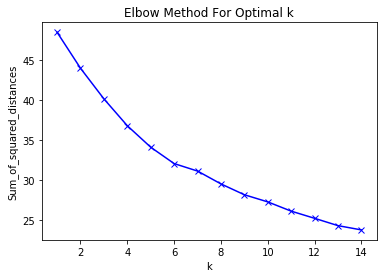

In [49]:
# plot the result to decide wich number will be fine
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [92]:
# Clustering with the number of clusters we chose : 6
kclusters = 6
km = KMeans(n_clusters=kclusters, random_state=0)
km = km.fit(lyon_grouped_clustering)

In [93]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', km.labels_)
lyon_merged = neighborhoods
lyon_merged.rename(columns={'Quartier': 'Neighborhood'}, inplace=True)

# merge lyon_grouped with neighborhoods to add latitude/longitude for each neighborhood
lyon_merged = lyon_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

lyon_merged.head() # check the last columns!

,Neighborhood,Lat,Long,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Quartier Clochettes,45.692397,4.855934,5.0,Hotel,SecondarySchool,Museum,Zoo,Flea Market
1,Quartier Pasteur,45.691369,4.898562,0.0,Restaurant,Auto,Flea Market,Hotel,Hospital
2,Quartier Ménival La Cordière,45.695174,4.950974,5.0,PrimarySchool,Transportation,Services,FoodStore,Zoo
3,Quartier Ménival Battières La Plaine,45.752027,4.783056,0.0,Restaurant,PrimarySchool,Park,Sport,Shopping
4,Quartier Jules Guesde,45.710772,4.886712,1.0,Flea Market,Transportation,Shopping,Zoo,Hotel


In [94]:
# some neighborhoods have no venue, so we delete them
print(lyon_merged.count())
lyon_merged = lyon_merged.loc[lyon_merged['1st Most Common Venue'] != '0']
print(lyon_merged.count())

Neighborhood             201
Lat                      201
Long                     201
Cluster Labels           181
1st Most Common Venue    181
2nd Most Common Venue    181
3rd Most Common Venue    181
4th Most Common Venue    181
5th Most Common Venue    181
dtype: int64
Neighborhood             201
Lat                      201
Long                     201
Cluster Labels           181
1st Most Common Venue    181
2nd Most Common Venue    181
3rd Most Common Venue    181
4th Most Common Venue    181
5th Most Common Venue    181
dtype: int64


In [95]:
lyon_merged.dropna(inplace = True)
print(lyon_merged.count())

Neighborhood             181
Lat                      181
Long                     181
Cluster Labels           181
1st Most Common Venue    181
2nd Most Common Venue    181
3rd Most Common Venue    181
4th Most Common Venue    181
5th Most Common Venue    181
dtype: int64


In [96]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(lyon_merged['Lat'], lyon_merged['Long'], lyon_merged['Neighborhood'], lyon_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [97]:
# examin clusters
lyon_merged.loc[lyon_merged['Cluster Labels'] == 0, lyon_merged.columns[[0] + list(range(1, lyon_merged.shape[1]))]]

,Neighborhood,Lat,Long,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
1,Quartier Pasteur,45.691369,4.898562,0.0,Restaurant,Auto,Flea Market,Hotel,Hospital
3,Quartier Ménival Battières La Plaine,45.752027,4.783056,0.0,Restaurant,PrimarySchool,Park,Sport,Shopping
6,Quartier Guillotière,45.748928,4.848702,0.0,Restaurant,Hotel,PrimarySchool,SecondarySchool,Fast Food Restaurant
7,Quartier Monplaisir,45.742497,4.862965,0.0,Restaurant,Transportation,Bakery,PrimarySchool,Hobbies
8,Quartier Jean Macé,45.744234,4.848954,0.0,Restaurant,Transportation,Hotel,Music School,SecondarySchool
30,Quartier Gabriel Péri,45.705968,4.867932,0.0,Restaurant,Shopping,Theme Park,Theater,PrimarySchool
35,Quartier Bellecour Cordeliers,45.761606,4.833161,0.0,Restaurant,Bar,TakeAway,Café,Plaza
40,Quartier Arsenal,45.710629,4.861218,0.0,PrimarySchool,Theme Park,TakeAway,Café,Shopping
44,Quartier Mutualité Préfecture Moncey,45.758944,4.843683,0.0,Bar,Restaurant,Café,Hotel,Hospital
45,Quartier Vaulx Sud La Côte - La Tase - La Soie,45.763899,4.927830,0.0,Restaurant,TakeAway,Services,Hotel,Auto


In [98]:
lyon_merged.loc[lyon_merged['Cluster Labels'] == 1, lyon_merged.columns[[0] + list(range(1, lyon_merged.shape[1]))]]

,Neighborhood,Lat,Long,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
4,Quartier Jules Guesde,45.710772,4.886712,1.0,Flea Market,Transportation,Shopping,Zoo,Hotel
5,Quartier Colline des Funiculaires,45.755310,4.813213,1.0,Transportation,Tunnel,HighSchool,Plaza,SecondarySchool
9,Quartier Vignettes Figuières,45.663543,4.854375,1.0,Transportation,Zoo,Flea Market,Hotel,Hospital
11,Quartier Tour-Oasis,45.686110,4.864400,1.0,Transportation,Hospital,Zoo,Flea Market,Hotel
25,Quartier Gerland,45.727316,4.842380,1.0,Restaurant,Fast Food Restaurant,Transportation,SecondarySchool,Hospital
28,Quartier Laënnec Mermoz,45.732819,4.884241,1.0,Transportation,Services,Shopping,Gas Station,Restaurant
29,Quartier Centre,45.697931,4.880242,1.0,Services,Transportation,Theater,Shopping,Flea Market
32,Quartier Centre Ville,45.583330,4.770804,1.0,Transportation,Services,Restaurant,PrimarySchool,Park
36,Quartier Jean Moulin Henri Wallon,45.690066,4.872754,1.0,Transportation,Hospital,SecondarySchool,Restaurant,PrimarySchool
42,Quartier Centre-Est,45.703847,4.861500,1.0,Transportation,Services,Restaurant,PrimarySchool,Zoo


In [99]:
lyon_merged.loc[lyon_merged['Cluster Labels'] == 2, lyon_merged.columns[[0] + list(range(1, lyon_merged.shape[1]))]]

,Neighborhood,Lat,Long,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
23,Quartier Vancia,45.838479,4.905658,2.0,Sport,FoodStore,Zoo,Flea Market,Hotel
59,Quartier Crépieux,45.806383,4.897724,2.0,Transportation,Sport,Zoo,Flea Market,Hotel
64,Quartier Plantées,45.760421,5.014312,2.0,Sport,SecondarySchool,Zoo,Flea Market,Hotel
112,Quartier Saint-Jean,45.782890,4.902181,2.0,Sport,SecondarySchool,Zoo,Flea Market,Hotel
125,Quartier Vassieux,45.798651,4.867180,2.0,Sport,Bakery,Theater,Zoo,Flea Market
173,Quartier Semanet Les Charmilles,45.842714,4.742321,2.0,Sport,Zoo,Flea Market,Hotel,Hospital
174,Quartier Bois-Dieu Intra-Muros,45.842144,4.743022,2.0,Sport,Zoo,Flea Market,Hotel,Hospital
183,Quartier Le Charbonnier,45.660382,4.947100,2.0,Sport,Zoo,Flea Market,Hotel,Hospital


In [100]:
lyon_merged.loc[lyon_merged['Cluster Labels'] == 3, lyon_merged.columns[[0] + list(range(1, lyon_merged.shape[1]))]]

,Neighborhood,Lat,Long,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
73,Quartier Mercières Victor Hugo Loup Pendu,45.814252,4.877171,3.0,Services,Sport,Shopping,Restaurant,Zoo
76,Quartier Alaï,45.755006,4.762261,3.0,Services,Plaza,Zoo,Flea Market,Hotel
83,Quartier Secteur 1,45.832206,4.751216,3.0,Transportation,Services,Zoo,Flea Market,Hotel
90,Quartier Razes,45.671106,4.849489,3.0,Hotel,Gas Station,Services,Zoo,Flea Market
91,Quartier Terrasses Ferry Brassens,45.785830,5.023009,3.0,Services,Zoo,Flea Market,Hotel,Hospital
98,Quartier Les Mûriers,45.699263,4.823903,3.0,Fast Food Restaurant,Services,Supermarket,Shopping,SecondarySchool
107,Quartier Haute-Roche,45.698718,4.828909,3.0,Services,Fast Food Restaurant,Supermarket,Shopping,Zoo
113,Quartier Le Sud,45.661619,4.903948,3.0,Supermarket,Services,Zoo,Flea Market,Hotel
127,Quartier Bourlione Les Taillis,45.668079,4.906502,3.0,Services,Zoo,Flea Market,Hotel,Hospital
131,Quartier Le Plan,45.657327,4.936264,3.0,Services,Zoo,Flea Market,Hotel,Hospital


In [101]:
lyon_merged.loc[lyon_merged['Cluster Labels'] == 4, lyon_merged.columns[[0] + list(range(1, lyon_merged.shape[1]))]]

,Neighborhood,Lat,Long,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
39,Quartier Montrond Le Bas,45.582350,4.742567,4.0,Shopping,Fast Food Restaurant,Flea Market,Hotel,Hospital
66,Quartier Grand Mas - Cervelières - Sauveteurs,45.784401,4.913306,4.0,Shopping,SecondarySchool,Bakery,Zoo,Flea Market
88,Quartier Secteur 5,45.817748,4.744220,4.0,Shopping,FoodStore,Zoo,Flea Market,Hotel
108,Quartier Le Village,45.671176,4.902768,4.0,Shopping,Pharmacy,Services,Zoo,Flea Market
152,Quartier Cote-du-Mas La Roue La Réserve,45.857368,4.738210,4.0,Shopping,Zoo,Flea Market,Hotel,Hospital
163,Quartier Les Combattants,45.705846,4.814486,4.0,Park,Shopping,SecondarySchool,Zoo,Flea Market
179,Quartier Terraillon,45.744046,4.919294,4.0,Shopping,Zoo,Flea Market,Hotel,Hospital


In [102]:
lyon_merged.loc[lyon_merged['Cluster Labels'] == 5, lyon_merged.columns[[0] + list(range(1, lyon_merged.shape[1]))]]

,Neighborhood,Lat,Long,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Quartier Clochettes,45.692397,4.855934,5.0,Hotel,SecondarySchool,Museum,Zoo,Flea Market
2,Quartier Ménival La Cordière,45.695174,4.950974,5.0,PrimarySchool,Transportation,Services,FoodStore,Zoo
10,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635,5.0,HighSchool,TakeAway,Supermarket,SecondarySchool,Music School
14,Quartier Les Vernes,45.605012,4.761086,5.0,HighSchool,Hobbies,Pharmacy,Shopping,Services
15,Quartier Ferrandière Maisons Neuves,45.759133,4.876687,5.0,SecondarySchool,Hospital,HighSchool,Supermarket,Playground
16,Quartier Europe Mont-Blanc,45.813072,4.896404,5.0,TakeAway,Zoo,Flea Market,Hotel,Hospital
18,Quartier Piamateur Semailles,45.820867,4.913194,5.0,HighSchool,Theater,Services,Zoo,Flea Market
19,Quartier Villette Paul Bert,45.759544,4.869767,5.0,SecondarySchool,Hospital,Transportation,Hobbies,Plaza
20,Quartier Rillieux Village,45.823329,4.901722,5.0,PrimarySchool,Restaurant,Auto,Flea Market,Hotel
21,Quartier Montchat,45.746996,4.885980,5.0,SecondarySchool,Hospital,Supermarket,Sport,Plaza


In [103]:
create_download_link(lyon_merged)

# END